# Homework 2 - Programming

There are two main tasks in this programming assignment are to implement the **eight-point algorithm** and **four-point algorithm**. 

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import utils
import cv2

## Remarks before starting
Please take note of the following few things:

1. In your `hw2_progrmming` folder, there are two subfolders, namely `four_point` and `eight_point`. In each folder, there are four pairs of scenes (8 images in total) and a `numpy` file, which contains the numpy array of coordinate correspondences. Each image has dimensions (512, 512). For eight-point algorithm, you have 10 points for each pair of scene. For four-point algorithm, you have 6 points for each pair of scene. 
2. coordinate correspondences are given to you as a numpy array, with dimensions (4, 2, 10, 2) for eight-point and (4, 2, 6, 2) for four-point. The dimensions correspond to `(num_scenes, camera angle, num_pts, pixel_coordinates)`. I highly encourage you to print out the array to get a better sense of the x, y, and z axis. 
3. To transform pixel coordinates to Euclidean system, you will need the intrinsic matrix. In our synthetic dataset, the intrinsic matrix `K` is the same for all scenes and camera angles. 
4. Some helpful functions are implemented in `utils.py`. I encourage you to take a look before starting. 

In [2]:
K = np.array([[ 560    ,  0.        ,  0.        ],  # intrinsic matrix
              [ 0.        ,  560    ,  0.        ],
              [ 0.        ,  0.        ,  1.        ]])
K_inv = np.array([[ 1/560    ,  0.        ,  0.        ],  # inverse of intrinsic matrix
              [ 0.        ,  1/560    ,  0.        ],
              [ 0.        ,  0.        ,  1.        ]])

RTP = np.array([[ 0   ,  1     ,  0.        ],  
              [ -1        ,  0 ,  0.        ],
              [ 0.        ,  0.        ,1  ]])
RTN = np.array([[ 0   ,  -1     ,  0.        ],  
              [ 1        ,  0 ,  0.        ],
              [ 0.        ,  0.        ,1  ]])

## Eight Point Algorithm

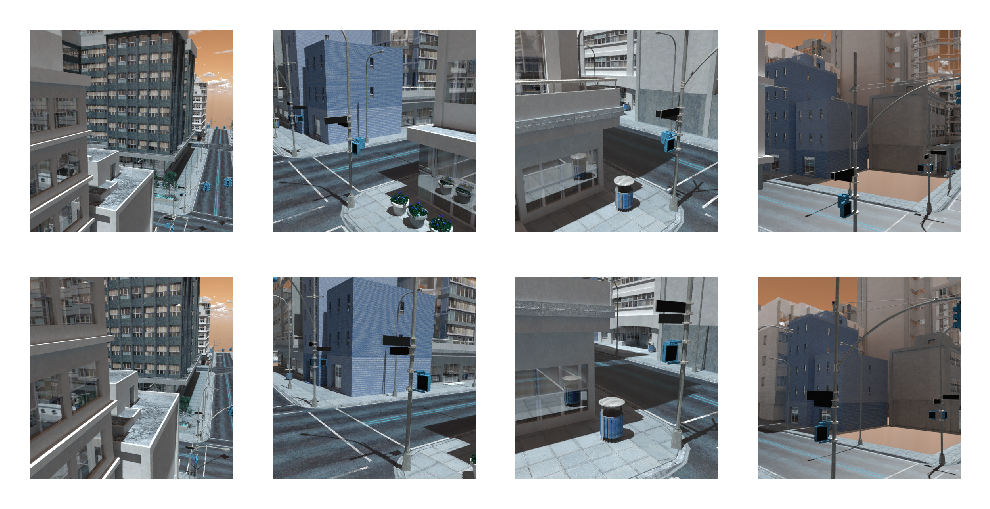

In [3]:
# data loading
folder = "./eight_point/"
img_arr = utils.load_scenes(folder)
utils.plot_scenes(img_arr)

In [4]:
# read correspondences
corr_8 = np.load(os.path.join(folder, 'eight_pt_corr.npy'))
corr_8.shape

(4, 2, 10, 2)

Using the image  2


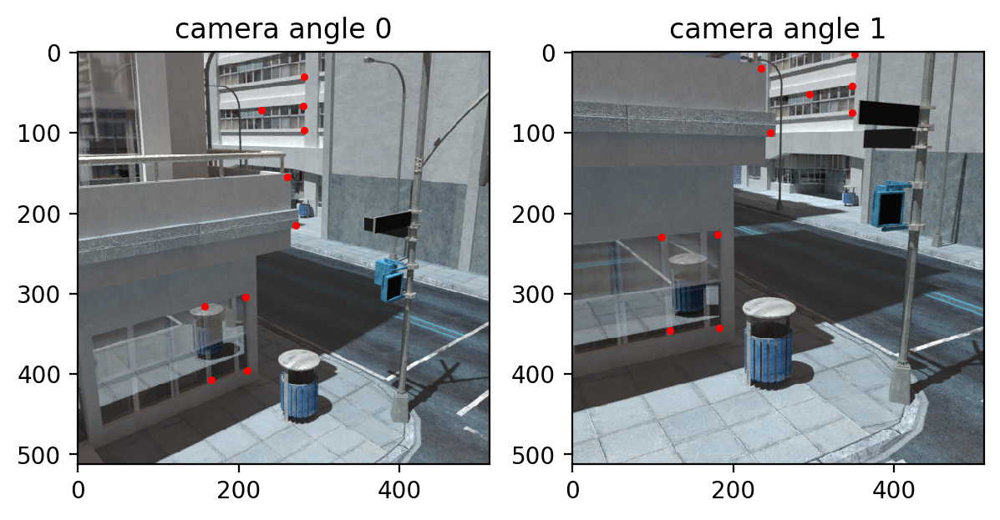

In [5]:

scene_id =2 # change this to view other scenes
print("Using the image ", scene_id)
utils.plot_correspondences(img_arr, corr_8, scene_id)

**TASK1**: Implement the eight-point algorithm below. 
> Show function is in collaboration with Xiao Anxing
### **Theory:**
We got $p_1,p_2$ from the image. Then we know
$$
x_1 = K^{-1}p_1\\
x_2 = K^{-1}p_2
$$
So the epipolar constraint is 
$$
p_2^TK^{-T}\hat T RK^{-1}p_1
$$
Now stack the $E$
$$
E^s \doteq [e_{11},e_{12},e_{13},e_{21},e_{22},e_{23},e_{32},e_{32},e_{33}]^T\in\mathbb R^9
$$
And define
$$
a\doteq x_1\otimes x_1
$$
So we get
$$
a^T E^s = 0
$$
Then assume
$$
\chi \doteq [a^1,a^2,a^3,...,a^n]^T\\
\implies \chi E^s = 0
$$
Solve the linear function, we can get $E$. Then we do decomposition on $E$:
$$
E = U\Sigma V^T\\
$$

![](https://www.zhihu.com/equation?tex=%5Chat+T_1+%3D+UR_Z%28%5Cfrac%7B%5Cpi%7D%7B2%7D%29%5CSigma+U%5ET%2CR_1+%3D+UR_Z%5ET%28%5Cfrac%7B%5Cpi%7D%7B2%7D%29V%5ET%5C%5C+%5Chat+T_2+%3D+UR_Z%28-%5Cfrac%7B%5Cpi%7D%7B2%7D%29%5CSigma+U%5ET%2CR_1+%3D+UR_Z%5ET%28-%5Cfrac%7B%5Cpi%7D%7B2%7D%29V%5ET%5C%5C )

Finally we select suitable $T,R$ by $\lambda_2 \hat T x_2 = \lambda_1 \hat T R x_1$
![](https://www.zhihu.com/equation?tex=\implies\begin{cases}<\hat Tx_2,\hat T Rx_1> \ \> 0\\<-\hat x_2 R x_1,\hat x_2,T> \ \ > 0\\<\widehat{Rx_1}x_2,\widehat{Rx_1}T>\ \ > 0\end{cases} )



--------------scene_id =  0 ----------------
The rotation is:
 [[ 0.99774807  0.01910478 -0.06429464]
 [-0.02070329  0.99949059 -0.02428855]
 [ 0.06379787  0.02556497  0.99763534]]
The translation is:
 [[ 0.08939293]
 [-0.57504272]
 [-0.81322492]]


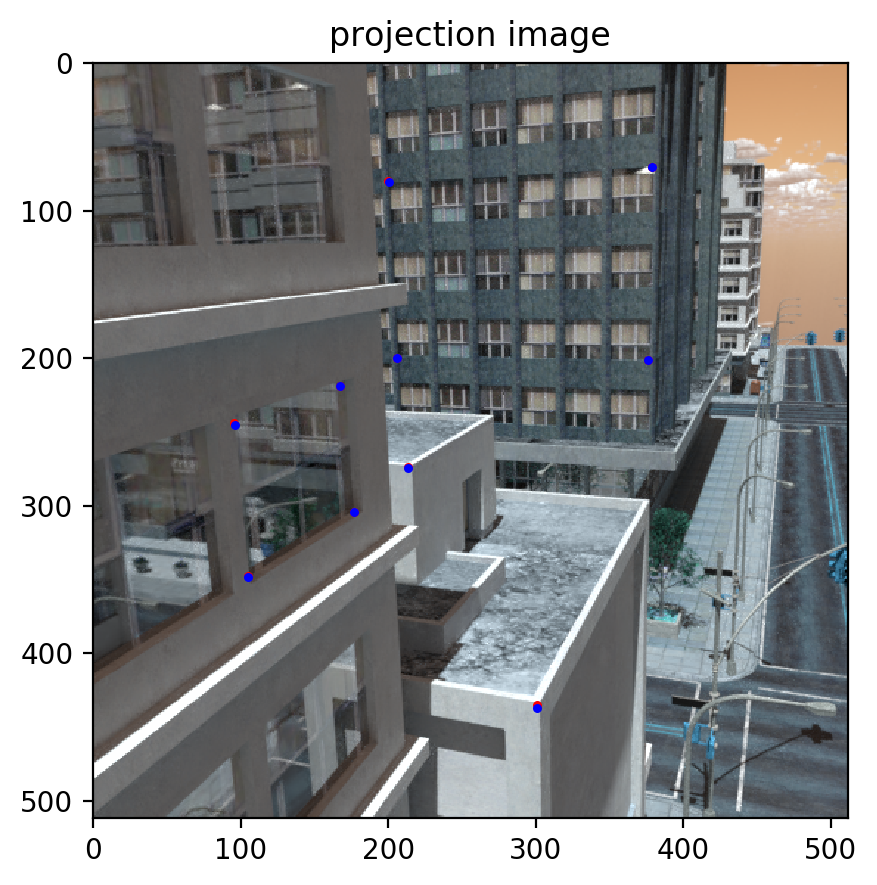

--------------scene_id =  1 ----------------
The rotation is:
 [[ 0.99775155 -0.02216088  0.06325133]
 [ 0.02108718  0.99962284  0.01759264]
 [-0.06361734 -0.01621929  0.99784256]]
The translation is:
 [[ 0.32218782]
 [-0.64915727]
 [-0.68904996]]


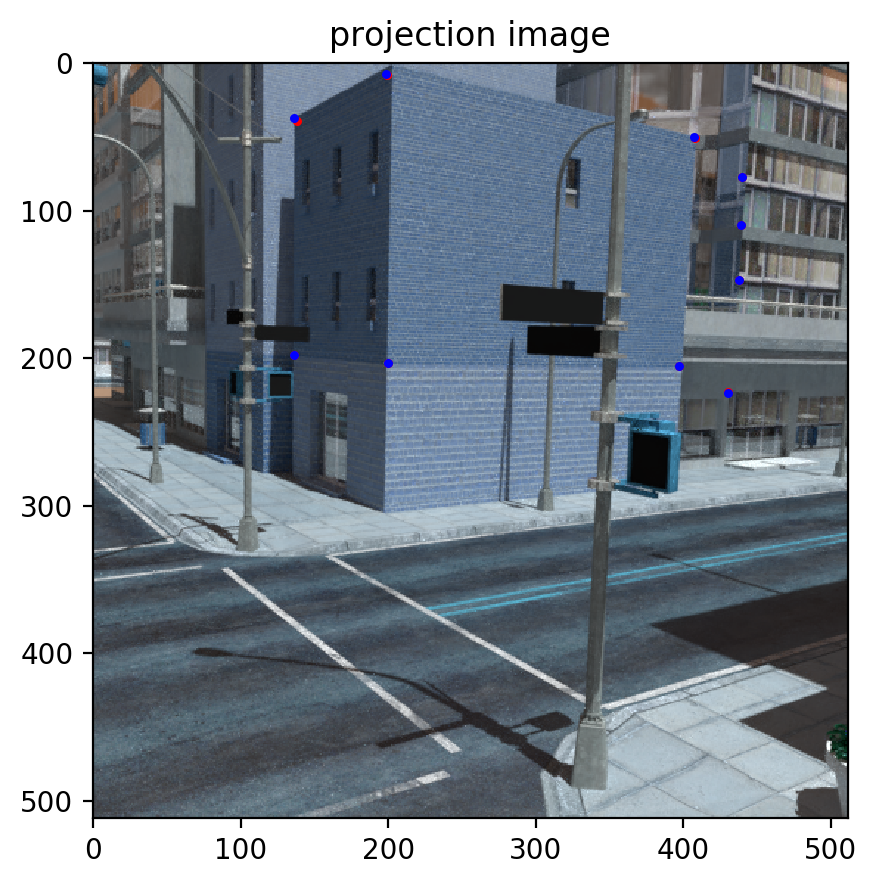

--------------scene_id =  2 ----------------
The rotation is:
 [[ 0.99034864 -0.02547923  0.13623648]
 [ 0.02144854  0.99929007  0.03097268]
 [-0.13692893 -0.02775167  0.99019206]]
The translation is:
 [[-0.62929841]
 [-0.7020808 ]
 [-0.33326575]]


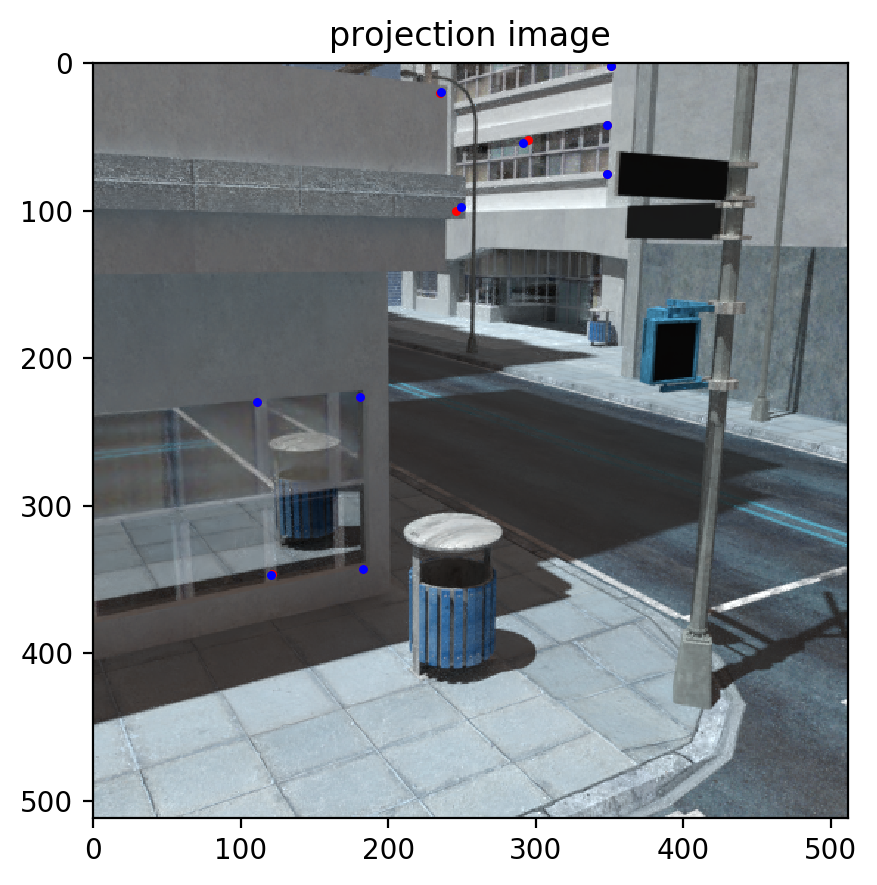

--------------scene_id =  3 ----------------
The rotation is:
 [[ 0.95982517 -0.0598667   0.27413796]
 [-0.00636123  0.97208155  0.23455704]
 [-0.28052661 -0.2268776   0.93264751]]
The translation is:
 [[-0.44336432]
 [-0.55021167]
 [ 0.70759819]]


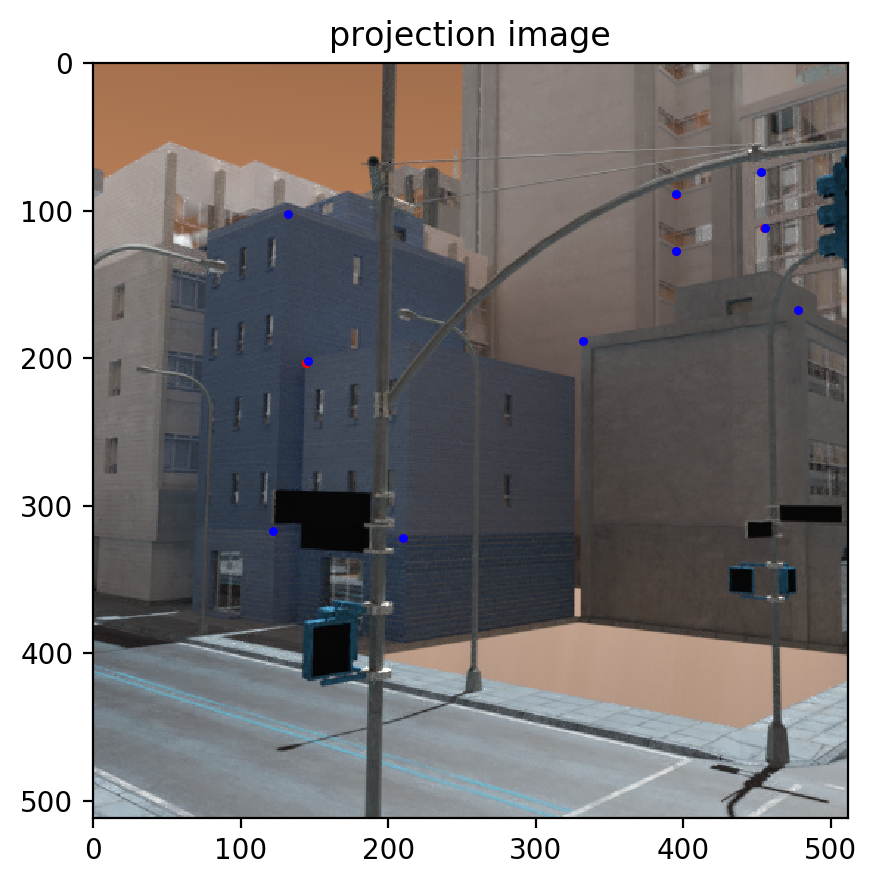

In [6]:
def eight_2(corr,im):
    pass

def hat2vec(T_hat):

    t = np.array([ -T_hat[1,2],  T_hat[0,2], -T_hat[0,1] ])
    return t

def vec2hat(t):
    if(t.shape[0] == 3):
        t=t.T
    t.reshape(3,1)
    t = np.mat(t)

    T_hat = np.array([[0, -t[0,2], t[0,1]],
                      [t[0,2], 0, -t[0,0]],
                      [-t[0,1], t[0,0], 0]])
    return T_hat


"""
This function is in collaboration with Anxing Xiao
"""
def show_projection(img_arr, scene_id, corr, R, T):
    x1 = corr[0]
    x2 = corr[1]
    x1 = x1 / 560
    x2 = x2 / 560
    x1[:, [0, 1]] = x1[:, [1, 0]]
    x2[:, [0, 1]] = x2[:, [1, 0]]
    X1 = np.append(x1[0], 1)
    X2 = np.append(x2[0], 1)
    l = x1.shape[0]
    X_projection = np.zeros([l, 2])

    for i in range(l):
        X1 = np.append(x1[i], 1)
        X2 = np.append(x2[i], 1)
        lambda1 = np.linalg.norm(vec2hat(X2) @ T) / np.linalg.norm(vec2hat(X2) @ R @ X1)
        lambda2 = np.linalg.norm((vec2hat(R @ X1) @ T)) / np.linalg.norm((vec2hat(R @ X1) @ X2))
        #         print(lambda1,lambda2)
        projection = (lambda1 * R.dot(X1).transpose() + T[:, 0])
        projection_xy = projection[:2] / lambda2
        X_projection[i,0] = projection_xy[0]
        X_projection[i,1] = projection_xy[1]

    im_i = scene_id  # image index 0-9 (please change this to see other scenes)
    fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(7, 5), dpi=200)
    ax.imshow(img_arr[im_i, 1])
    ax.scatter(x2[:, 0] * 560, x2[:, 1] * 560, c='r', s=5)
    ax.scatter(X_projection[:, 0] * 560, X_projection[:, 1] * 560, c='b', s=5)
    ax.set_title('projection image')
    plt.show()


def eight_point_algorithm(corr):
    y1 = corr[0, :, 0]
    x1 = corr[0, :, 1]
    y2 = corr[1, :, 0]
    x2 = corr[1, :, 1]
    chi = np.mat(np.zeros((9, 1)))
    for i in range(0, len(x1)):
        p_1 = np.array([x1[i], y1[i], 1]).T
        p_2 = np.array([x2[i], y2[i], 1]).T
        x_1_ = K_inv.dot(p_1)
        x_2_ = K_inv.dot(p_2)
        a_ = np.mat(np.kron(x_1_, x_2_))
        chi = np.hstack((chi, a_.T))
    chi = chi[:, 1:].T
    evalue, evector = np.linalg.eig(chi.T@chi)
    minVec = evector[:,np.argmin( evalue)]
    E0 = (minVec.reshape(3, 3)).T
    Rzs = [RTN, RTP]
    p_1 = np.array([x1[0], y1[0], 1]).T
    p_2 = np.array([x2[0], y2[0], 1]).T
    x_1 = K_inv.dot(p_1)
    x_2 = K_inv.dot(p_2)
    U, S, Vh = np.linalg.svd(-E0)
    ss = np.diag([1, 1, 0])
    for Rz in Rzs:
        for RzT in Rzs:
            R_ = U @ Rz.T @ Vh
            T_hat = U @ RzT @ ss @ U.T
            T_ = hat2vec(T_hat)
            if (vec2hat(T_) @ x_2 @ vec2hat(T_) @ R_ @ x_1 > 0
            and vec2hat(x_2) @ R_ @ x_1 @ vec2hat(x_2) @ T_ <= 0
            and vec2hat(R_ @ x_1) @ x_2 @ vec2hat(R_ @ x_1) @ T_ > 0):
                R = np.mat(R_)
                T = np.mat(T_).T
    return R, T




def opencv8Points(corr, im):
    # print("------------------------OpenCV--------------------------")
    y0 = corr[im][0, :, 0]
    x0 = corr[im][0, :, 1]
    y1 = corr[im][1, :, 0]
    x1 = corr[im][1, :, 1]
    points1 = np.mat(np.array([x0,y0])).T
    points2 = np.mat(np.array([x1, y1])).T
    E = cv2.findEssentialMat(points1=points1,points2=points2,method=cv2.RANSAC,cameraMatrix=K)
    U,S,Vh = np.linalg.svd(E[0])
    R = np.zeros((3,3))
    T = np.zeros((3,1))
    # E = np.asarray(E)
    Ee= np.array(E[0], dtype='float')
    cv2.recoverPose(E=Ee,points1=points1,points2=points2,cameraMatrix=K, R=R,t=T)

    return R,T



for i in range(0,4):
    scene_id = i
    R,T = eight_point_algorithm(corr_8[scene_id])
    R,T = opencv8Points(corr_8,scene_id)
    print("--------------scene_id = ",i,"----------------")
    print("The rotation is:\n", R)
    print("The translation is:\n", T)
    show_projection(img_arr,scene_id,corr_8[scene_id],R,T)


## Four-point Algorithm

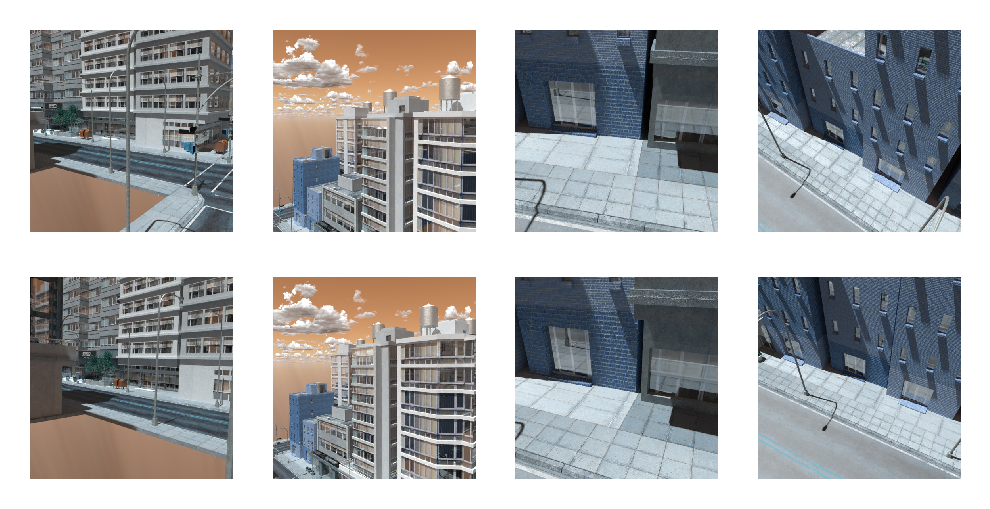

In [7]:
# data loading
folder = "./four_point/"
img_arr = utils.load_scenes(folder)
utils.plot_scenes(img_arr)

In [8]:
# read correspondences
corr_4 = np.load(os.path.join(folder,'four_pt_corr.npy'))

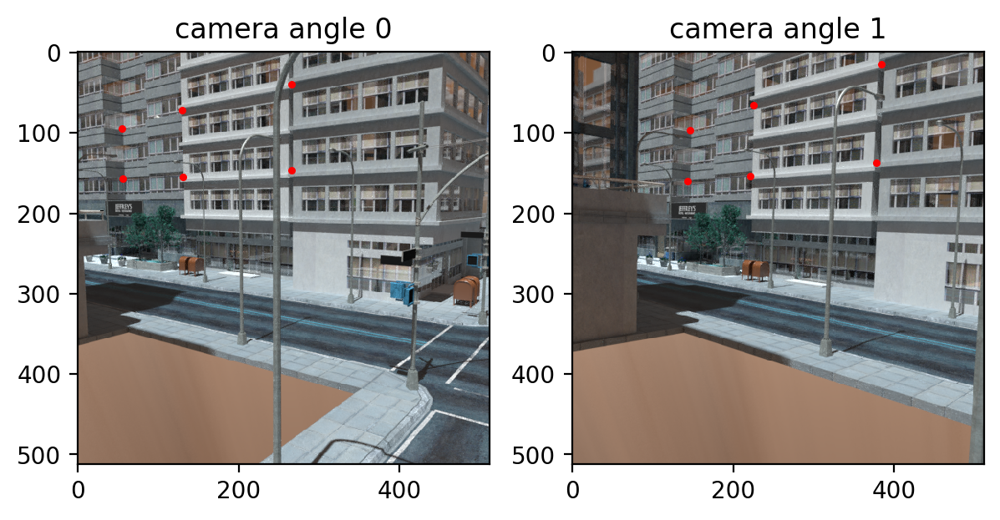

In [9]:
# plotting correspondences
scene_id = 0
utils.plot_correspondences(img_arr, corr_4, scene_id)

**TASK2**: Implement the four-point algorithm below

### **Theory:**
We got $p_1,p_2$ from the image. Then we know
$$
x_1 = K^{-1}p_1\\
x_2 = K^{-1}p_2
$$
Now stack the $H$
$$
H^s \doteq [H_{11},H_{12},H_{13},H_{21},H_{22},H_{23},H_{32},H_{32},H_{33}]^T\in\mathbb R^9
$$
And define
$$
a\doteq x_1\otimes \widehat{x_1} \in \mathbb R^{9\times 3}
$$
So we get
$$
a^T H^s = 0
$$
Then assume
$$
\chi \doteq [a^1,a^2,a^3,...,a^n]^T\\
\implies \chi H^s = 0
$$
Solve the linear function, we can get $E$. Then we do decomposition on $H$:
$$
H^TH = V\Sigma V^T\\
$$
$$
u_{1,2} \doteq \frac{\sqrt{1-\sigma_3^2}v_1 \pm \sqrt {\sigma_1^2-1}v_3}{\sqrt{\sigma_1^2-\sigma_3^2}} \\
$$
Then define
$$
U_1 = [v_2,u_1,\hat v_2 u_1], W_1 = [Hv_2,Hu_1,\widehat{Hv_2},Hu_1]\\
U_2 = [v_2,u_2,\hat v_2 u_2], W_1 = [Hv_2,Hu_2,\widehat{Hv_2},Hu_2]\\
$$
![](https://pic3.zhimg.com/v2-912c17475b8aa3b4dc2eb8719c56037a_b.png)
Finally we select suitable $T,R$ by
$$
N^Te_3 = n_3 > 0
$$



------------------------ 4 Point ----------------------------


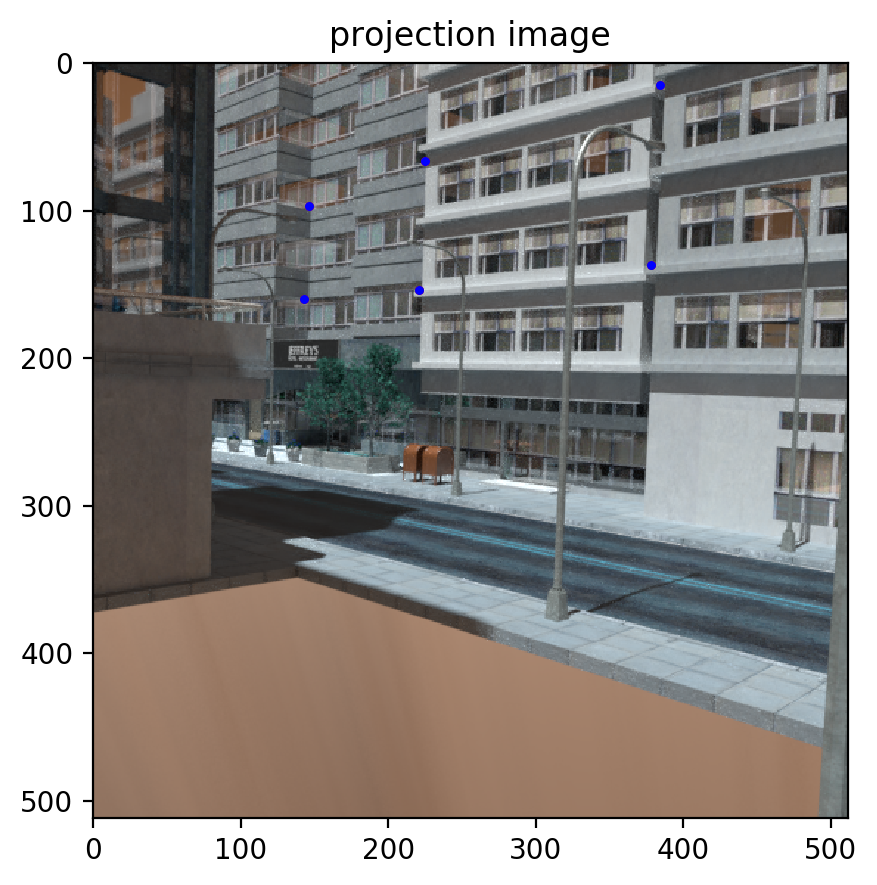

--------------scene_id =  0 ----------------
The possible rotation 1 is:
 [[ 0.98347809 -0.04476488  0.1754051 ]
 [ 0.04257928  0.99896165  0.01620593]
 [-0.17594842 -0.00846956  0.98436295]]
The possible translation 1 is:
 [[-0.10973976]
 [-0.17047429]
 [-0.09555745]]
The possible rotation 2 is:
 [[ 0.95162667  0.09624755  0.29179288]
 [-0.11089892  0.99324809  0.03405387]
 [-0.28654512 -0.06476608  0.95587512]]
The possible translation 2 is:
 [[-0.21543586]
 [-0.0382039 ]
 [ 0.04861461]]


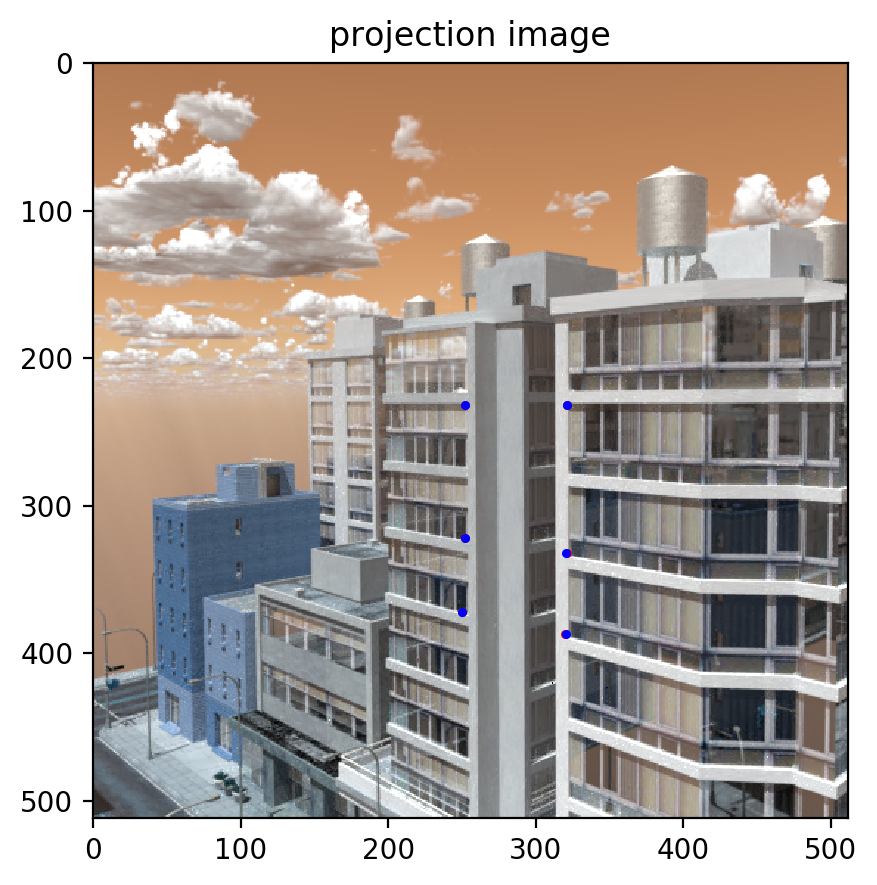

--------------scene_id =  1 ----------------
The possible rotation 1 is:
 [[ 0.99974962 -0.01602008 -0.01562253]
 [ 0.01684029  0.99840613  0.0538666 ]
 [ 0.01473468 -0.0541162   0.99842592]]
The possible translation 1 is:
 [[ 0.00973107]
 [-0.09970713]
 [ 0.1107568 ]]
The possible rotation 2 is:
 [[ 0.995859    0.04825267 -0.07704896]
 [-0.05062184  0.99829395 -0.02909671]
 [ 0.07551351  0.03287658  0.99660265]]
The possible translation 2 is:
 [[0.09407394]
 [0.01206274]
 [0.11535969]]


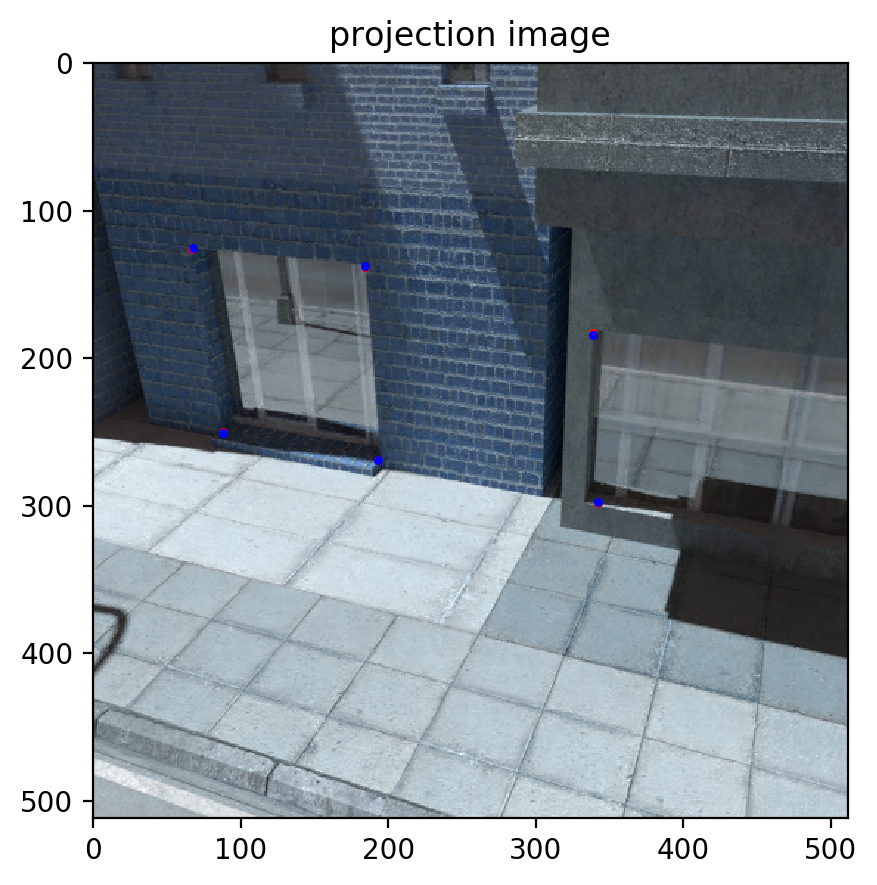

--------------scene_id =  2 ----------------
The possible rotation 1 is:
 [[ 0.98934725 -0.01948106  0.14426539]
 [ 0.0165601   0.9996334   0.02142047]
 [-0.1446298  -0.01880323  0.98930716]]
The possible translation 1 is:
 [[-0.20136424]
 [-0.04699813]
 [ 0.02955795]]
The possible rotation 2 is:
 [[ 0.99818009  0.05995769 -0.00644788]
 [-0.06000739  0.99816736 -0.00781234]
 [ 0.00596765  0.00818504  0.99994869]]
The possible translation 2 is:
 [[ 0.15297981]
 [-0.04564663]
 [ 0.13469825]]


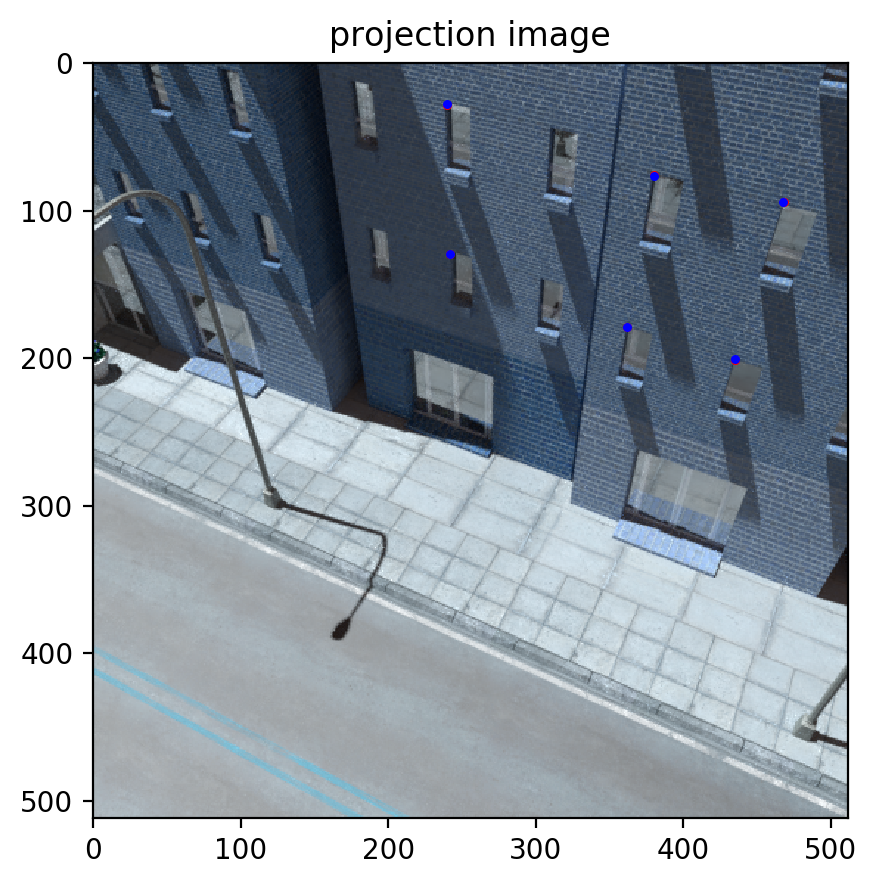

--------------scene_id =  3 ----------------
The possible rotation 1 is:
 [[ 0.98323484  0.0408793  -0.17770235]
 [-0.02340815  0.99477973  0.09932445]
 [ 0.18083501 -0.09349958  0.979059  ]]
The possible translation 1 is:
 [[ 0.4912382 ]
 [-0.2809729 ]
 [ 0.01846227]]
The possible rotation 2 is:
 [[ 9.96939961e-01 -3.24815221e-04  7.81703797e-02]
 [ 4.08874025e-03  9.98839206e-01 -4.79950383e-02]
 [-7.80640504e-02  4.81677900e-02  9.95784047e-01]]
The possible translation 2 is:
 [[-0.39211154]
 [ 0.26465026]
 [-0.31114366]]


In [10]:

def four_point_algorithm(corr, im):

    y0 = corr[im][0, :, 0]
    x0 = corr[im][0, :, 1]
    y1 = corr[im][1, :, 0]
    x1 = corr[im][1, :, 1]
    chi = np.zeros((9, 1))

    chi = np.zeros((9, 1))
    for i in range(0, len(x1)):
        p_1 = np.array([x0[i], y0[i], 1]).T
        p_2 = np.array([x1[i], y1[i], 1]).T
        x_1 = K_inv.dot(p_1)
        x_2 = K_inv.dot(p_2)
        x_2_hat = vec2hat(x_2)
        a_ = np.mat(np.kron(x_1, x_2_hat))
        chi = np.hstack((chi, a_.T))
    chi = chi[:, 1:].T
    evalue, evector = np.linalg.eig(chi.T @ chi)
    minVec = evector[:, np.argmin(evalue)]
    f = (minVec.reshape(3, 3)).T
    HL = f.reshape(3,3)
    U_, S_, V_ = np.linalg.svd(HL)
    H = HL / S_[1]
    p_1 = np.array([x0[i], y0[i], 1]).T
    p_2 = np.array([x1[i], y1[i], 1]).T
    x_1 = K_inv.dot(p_1)
    x_2 = K_inv.dot(p_2)
    if ((x_2.T @ H @ x_1)<0):
        H = -H
    V, S, VT = np.linalg.svd(H)
    v_1 = np.mat(VT[0][:]).T
    v_2 = np.mat(VT[1][:]).T
    v_3 = np.mat(VT[2][:]).T
    u_1 = (np.sqrt(1 - S[2] ** 2) * v_1 + np.sqrt(S[0] ** 2 - 1) * v_3) / np.sqrt(S[0] ** 2 - S[2] ** 2)
    u_2 = (np.sqrt(1 - S[2] ** 2) * v_1 - np.sqrt(S[0] ** 2 - 1) * v_3) / np.sqrt(S[0] ** 2 - S[2] ** 2)
    W1 = np.hstack((H.dot(v_2), H.dot(u_1), vec2hat(H.dot(v_2).T)@H.dot(u_1)))
    W2 = np.hstack((H.dot(v_2), H.dot(u_2), vec2hat(H.dot(v_2).T)@H.dot(u_2)))
    U1 = np.hstack((v_2, u_1, np.cross(v_2.T, u_1.T).T))
    U2 = np.hstack((v_2, u_2, np.cross(v_2.T, u_2.T).T))
    # CHECK RIGHT RT

    R=[]
    T=[]
    N=[]
    e3 = np.mat(np.array([0, 0, 1])).T
    R1 = W1.dot(U1.T)
    N1 = vec2hat(v_2.T).dot(u_1)
    T1 = (H - R1).dot(N1)
    cnt = 0
    if (N1.T@e3 > 0):
        R.append(R1)
        T.append(T1)
        N.append(N1)
        cnt += 1
    R2 = W2.dot(U2.T)
    N2 = vec2hat(v_2).dot(u_2)
    T2 = (H - R2).dot(N2)
    if (N2.T.dot(e3) > 0):
        R.append(R2)
        T.append(T2)
        N.append(N2)
    R3 = R1
    N3 = -N1
    T3 = -T1
    if (N3.T.dot(e3) > 0):
        R.append(R3)
        T.append(T3)
        N.append(N3)
    R4 = R2
    N4 = -N2
    T4 = -T2
    if (N4.T.dot(e3) > 0):
        R.append(R4)
        T.append(T4)
        N.append(N4)
    p_1 = np.array([x0[0], y0[0], 1]).T
    p_2 = np.array([x1[0], y1[0], 1]).T
    x_1 = K_inv.dot(p_1)
    x_2 = K_inv.dot(p_2)

    return (R[0], N[0], T[0]), (R[1], N[1], T[1])


print("------------------------ 4 Point ----------------------------")
for i in range(0,4):
    scene_id =i
    ((R1, N1, T1), (R2, N2, T2)) = four_point_algorithm(corr_4, scene_id)
    show_projection(img_arr, scene_id, corr_4[scene_id], R1, T1)
    print("--------------scene_id = ",i,"----------------")
    print("The possible rotation 1 is:\n", R1)
    print("The possible translation 1 is:\n", T1)
    print("The possible rotation 2 is:\n", R2)
    print("The possible translation 2 is:\n", T2)

End of Assignment